# Foraging toolkit demo - random foragers

## Outline
* [Introduction](#introduction)
* [Simulation](#simulation)
* [Derived quantities](#derived-quantities)
  * [Computation](#computation)
  * [Visualization](#visualization)
* [Inference](#inference)

## Introduction

Users of the foraging toolkit are interested in analyzing animal movement data, with the goal of determining what factors contribute to each agent's decisions of where to move. 

Given either a simulation output or real-world measured location data, we would like to infer which factors influence the agents' movement.
In this notebook, we consider two possible factors: proximity to other agents, and closeness to food. Each factor has an associated score that is computed at each location where an agent might move. These scores are used as derived predictors in a statistical model of agents' movements. 

The fit coefficients of these derived predictor scores can be interpreted as how predictive each factor is of agents' movement decisions.

For more details, see [1], in particular Fig.2.

To validate the methodology, this notebook uses the foraging toolkit to simulate movements of random foraging agents, moving in random directions with random step sizes (with some step distance preferences). Therefore, we expect that neither proximity nor food have any significant effect at the inference stage (i.e. the corresponding predictor coefficients should be close to zero).

---

[1] R. Urbaniak, M. Xie, and E. Mackevicius, “Linking cognitive strategy, neural mechanism, and movement statistics in group foraging behaviors,” Sci Rep, vol. 14, no. 1, p. 21770, Sep. 2024, [doi: 10.1038/s41598-024-71931-0.](https://www.nature.com/articles/s41598-024-71931-0)

In [1]:
# importing packages. See https://github.com/BasisResearch/collab-creatures for repo setup
import logging
import os
import random
import time

import dill
import matplotlib.pyplot as plt
import numpy as np
import plotly.io as pio
import pyro
from IPython.display import HTML

pio.renderers.default = "notebook"

import collab.foraging.toolkit as ft
from collab.foraging import random_hungry_followers as rhf

logging.basicConfig(format="%(message)s", level=logging.INFO)

# users can ignore smoke_test -- it's for automatic testing on GitHub,
# to make sure the notebook runs on future updates to the repository
smoke_test = "CI" in os.environ
num_svi_iters = 10 if smoke_test else 1000
num_samples = 10 if smoke_test else 1000

notebook_starts = time.time()

## Simulation

The `random-hungry-followers` module, imported as `rhf`, lets us simulate different groups of agents foraging in a gridworld environment. The user can adjust how big the environment is, how many agents are in the group, how much food reward is present, etc. The `probabilities` argument controls the (unnormalized) probability of choosing a step of each size in `[-max_step_size, max_step_size]`. For further explanation of what each input parameter means, run `help(rhf.RandomForagers)`.

Currently the step sizes are pre-defined to the range $[-4,\dots,4]$.

**Simulation of Random Foragers**

- **Initialization**
    - Initialize the grid with a specified grid size.
    - Randomly place `num_rewards` rewards on the grid.
    - Normalize the probabilities for forager step size.

- **Generate Random Paths**
    - For each forager:
        - Generate random `x` and `y` coordinates as the cumulative sum of centered random steps based on the initialized probabilities, for example:
            ```python
            forager_x = np.cumsum(np.random.choice(num_steps, num_frames, probabilities, replace=True)) + (grid_size / 2)
            forager_y = ...  # same as for x
            ```
        - Ensure the coordinates stay within the grid bounds.

- **Update Rewards**
    - At each frame, remove a reward if a forager is next to it, starting from that frame onward.

In [2]:
random.seed(23)
np.random.seed(23)

num_frames = 5 if smoke_test else 50  # The number of frames in the simulation.
grid_size = 40  # The size of the grid representing the environment.

random_foragers_sim = rhf.RandomForagers(
    grid_size=grid_size,  # The size of the grid representing the environment.
    probabilities=[
        1,
        2,
        3,
        2,
        1,
        2,
        3,
        2,
        1,
    ],  # (potentially unnormalized) probabilities for each step size in [-4..4]
    num_foragers=3,  # The number of (randomly moving) foragers.
    num_frames=num_frames,  # The number of frames in the simulation.
    num_rewards=15,  # The number of rewards initially in the environment.
    # Will disappear as foragers grab them by being within the `grab_range`.
    grab_range=3,  # The range within which rewards can be grabbed.
)

# run a particular simulation with these parameters
random_foragers_sim()

# the results of the simulation are stored in `random_foragers_sim.foragersDF` DataFrame.
# each row contains the x and y coordinates of a forager at a particular time

random_foragers_sim.foragersDF.head()

,x,y,time,forager,type
0,20.0,23.0,0,0,random
1,24.0,23.0,1,0,random
2,26.0,25.0,2,0,random
3,24.0,28.0,3,0,random
4,22.0,26.0,4,0,random


We can plot the generated trajectories using `plot_trajectories`, passing the corresponding `DataFrame`.

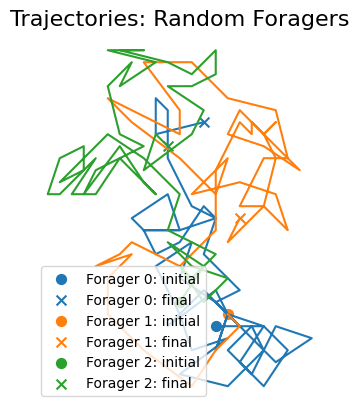

In [3]:
ft.plot_trajectories(random_foragers_sim.foragersDF, "Random Foragers")
plt.show()

The foragers' movements can be visualized using the `animate_foragers` function.

In [4]:
ft.animate_foragers(
    random_foragers_sim, width=600, height=400, plot_rewards=True, point_size=6
)

## Derived quantities

Suppose we observed this movement data from agents out in the world, and have several hypotheses for what may be contributing to the agents' movement decisions. We'll calculate derived predictor scores, which have high weight at locations/times where that hypothesis predicts that birds would want to go. 

In practice, given the simulated data, we compute the values of the different derived quantities:
1. Predictors: $f_k^{(i)}(x,y,t),\;k=1,\dots,N_{p}$ for every forager $i$ at every timestep $t$, giving the predicted expected future value of $f_k$ for forager $i$ at every grid point $(x,y)$ and time step $t+1$. 
2. Scores: $S^{(i)}(x,y,t)$ can be regarded as conditional probabilities of the forager $i$'s location at time $t+1$, given the simulation state at time $t$.  This function has a peak at the actual location at time $t+1$, and decays with distance from that point.

__Note__: as we shall see below, the values of $f_k^{(i)}$ and $S^{(i)}$ are evaluated only over the so-called _local window_ $W(i,t)$ corresponding to the immediate surroundings of forager $i$ at time $t$ (i.e. all the locations where it can possibly go).

In the remainder of this section we elaborate on how $f_k$ and $S$ are actually computed.

At the inference stage, we shall fit the scores to a linear combination of predictors with unknown coefficients. See [Inference](#inference) section below for more details.


### Computation

The main function computing the predictors is `derive_predictors_and_scores` (see documentation by `help(ft.derive_predictors_and_scores)`)

In [5]:
help(ft.derive_predictors_and_scores)

Help on function derive_predictors_and_scores in module collab.foraging.toolkit.derive:

derive_predictors_and_scores(foragers_object: collab.foraging.toolkit.utils.dataObject, local_windows_kwargs: Dict[str, Any], predictor_kwargs: Dict[str, Dict[str, Any]], score_kwargs: Dict[str, Dict[str, Any]], dropna: Optional[bool] = True, add_scaled_values: Optional[bool] = False) -> pandas.core.frame.DataFrame
    A function that calculates a chosen set of predictors and scores for data by inferring their names from
    keys in `predictor_kwargs` & `score_kwargs`, and dynamically calling the corresponding functions.
    :param foragers_object: instance of dataObject class containing the trajectory data of foragers.
    :param local_window_kwargs: dictionary of keyword arguments for `generate_local_windows` function.
    :param predictor_kwargs: nested dictionary of keyword arguments for predictors to be computed.
            Keys of predictor_kwargs set the name of the predictor to be computed

The local windows $W(i,t) \subset \mathfrak{G}$, where $\mathfrak{G}:=[0:\textrm{grid size}-1]^2$ is the entire computational grid, are used to compute the predictors and the scores over. A local window is generated for each forager $i$ at every time step $t$, and it consists of all the grid points where forager $i$ can possibly go at step $t+1$.

In [6]:
help(ft.local_windows.generate_local_windows)

Help on function generate_local_windows in module collab.foraging.toolkit.local_windows:

generate_local_windows(foragers_object: collab.foraging.toolkit.utils.dataObject) -> List[List[pandas.core.frame.DataFrame]]
    A wrapper function that calculates `local_windows` for a dataObject by calling `_generate_local_windows`
    with parameters inherited from the dataObject.
    :param foragers_object: dataObject containing foragers trajectory data
        Must have `local_windows_kwargs` as an attribute
    
    :return: Nested list of local_windows (DataFrames with "x","y" columns) grouped by forager index and time
    
    The list of keyword arguments:
        :param window_size: radius of local_windows. Default: 1.0
        :param sampling_fraction: fraction of grid points to sample. It may be advisable to subsample
            grid points for speed
        :param random_seed: random state for subsampling. Default: 0
        :param skip_incomplete_frames: Defaults to False. If True, 

Let's use sensible defaults:

In [7]:
local_windows_kwargs = {
    "window_size": 10,
    "sampling_fraction": 1,
    "skip_incomplete_frames": False,
}

The list of available predictors and scores can be obtained via the following:

In [8]:
available_predictors = ft.get_list_of_predictors()
available_scores = ft.get_list_of_scores()

print("Available predictors: ", available_predictors)
print("Available scores: ", available_scores)

Available predictors:  ['access', 'communication', 'food', 'pairwiseCopying', 'proximity', 'vicsek']
Available scores:  ['nextStep']


In the example below, we'll use `proximity`, `food` and `access` predictors.

In [9]:
help(ft.generate_proximity_predictor)

Help on function generate_proximity_predictor in module collab.foraging.toolkit.proximity:

generate_proximity_predictor(foragers_object: collab.foraging.toolkit.utils.dataObject, predictor_name: str)
    Generates proximity-based predictors for a group of foragers by invoking the proximity predictor mechanism.
    
    This function retrieves the relevant parameters from the provided `foragers_object` and uses them to compute
    the proximity predictor values. It relies on the `_proximity_predictor` function to handle the detailed
    calculations and updates.
    
    :param foragers_object: A data object containing information about the foragers, including their positions,
                            trajectories, and local windows. Such objects can be generated using `object_from_data`.
    :param predictor_name: The name of the proximity predictor to be generated, used to fetch relevant parameters
                           from `foragers_object.predictor_kwargs` and to store the

Generally predictors take this form:
$$
f_{\text{proximity}}^{(i)}(x,y,t) = \sum_{j \in \mathrm{NB}(i,t)}\operatorname{prox}\left(\operatorname{dist}(forager_j(t), (x,y))\right),\qquad (x,y)\in W(i,t),
$$
where $\mathrm{NB}(i,t)$ is the set of foragers interacting with $i$ at time $t$, $forager_j(t)=(x_j(t),y_j(t))$ is the location of forager $j$ at time $t$, $\operatorname{prox}$ is the proximity function, and $W(i,t)$ is the local window. The proximity function is function of distance only. For example, the piecewise proximity function is defined as follows:
1. For distances less than or equal to `repulsion_radius`, it applies a sine function to model
       an increasing proximity effect, starting at -1 and reaching 0 at `repulsion_radius`.
2. For distances between `repulsion_radius` and a mid-range value derived from `optimal_distance`, it
       applies another sine function to model proximity improvement.
3. For distances beyond the optimal range, proximity decays exponentially, representing a
       diminishing effect.


Similarly one can look up the descriptions for the other predictors.

In [10]:
help(ft.generate_access_predictor)

Help on function generate_access_predictor in module collab.foraging.toolkit.access:

generate_access_predictor(foragers_object: collab.foraging.toolkit.utils.dataObject, predictor_name: str)
    Generates access-based predictors for a group of foragers. Access is defined as the ability of a forager
    to reach a specific location in space. For a homogeneous environment, the value of the predictor is
    inversely proportional to the distance between the forager and the target location. The decay function
    can be customized.
    
    Arguments:
    :param foragers_object: A data object containing information about the foragers, including their positions,
                            trajectories, and local windows. Such objects can be generated using `object_from_data`.
    :param predictor_name: The name of the access predictor to be generated, used to fetch relevant parameters
                           from `foragers_object.predictor_kwargs` and to store the computed values.
    

So we have
$$
f_{\text{access}}^{(i)}(x,y,t) = \exp(-\alpha*\operatorname{dist}(forager_i(t), (x,y))),\qquad (x,y)\in W(i,t),
$$
where $W(i,t)$ is the local window around forager $i$ at time $t$.

In [11]:
help(ft.generate_food_predictor)

Help on function generate_food_predictor in module collab.foraging.toolkit.food:

generate_food_predictor(foragers_object: collab.foraging.toolkit.utils.dataObject, predictor_name: str)
    Generates food-based predictors for a group of foragers. Food is given
    by the presence of rewards in the environment. The value of the predictor
    is proportional to the rewards in the vicinity of the forager. The decay
    function can be customized.
    
    Arguments:
    :param foragers_object: A data object containing information about the foragers, including their positions,
                            trajectories, and local windows. Such objects can be generated using `object_from_data`.
    :param predictor_name: The name of the food predictor to be generated, used to fetch relevant parameters
                           from `foragers_object.predictor_kwargs` and to store the computed values.
    
    :return: A list of lists of pandas DataFrames where each DataFrame has been updated 

In other words:

$$
f_{\text{food}}^{(i)}(x,y,t) = \sum_{r=1}^{N_{rewards}(t)} \exp(-\alpha \operatorname{dist}(reward_r(t), (x,y))),\quad (x,y)\in W(i,t).
$$

Note that the number of rewards can change with $t$ as food gets consumed.

The score computation is completely analogous: it is done over the local windows, and computed for each forager at every time step.

In [12]:
help(ft.generate_nextStep_score)

Help on function generate_nextStep_score in module collab.foraging.toolkit.next_step_score:

generate_nextStep_score(foragers_object: collab.foraging.toolkit.utils.dataObject, score_name: str)
    A wrapper function that computes `next_step_score` only taking `foragers_object` as argument,
    and calling `_generate_next_step_score` under the hood.
    
    The next step score computes a score for how far grid points are from the next position of a forager.
    If the next position of the forager is unavailable, nan values are assigned to the scores.
    
    The formula for the score is:
        next_step_score(i,t,x,y) = 1 - (d_scaled) ** n
        where d_scaled = (d - min(d)) / (max(d) - min(d))
    
    Here d is the vector of distances of grid points in the local window of forager i at time t
    from the position of forager i at time t+1.
    
    :param foragers_object: dataObject containing positional data, local_windows, score_kwargs
    :param score_name : name of column to 

So we have:

$$
\begin{align*}
S_{\text{next\_step}}^{(i)}(x,y,t) &= 1 - \biggl(\frac{d(x,y)-D_{\min}}{D_{\max}-D_{\min}}\biggr)^n,\quad (x,y)\in W(i,t),\quad \text{where}\\
d(x,y) &= \operatorname{dist}(forager_i(t+1),(x,y))\\
D_{\min} &:= \min_{(x,y)\in W(i,t)} d(x,y),\\
D_{\max} &:= \max_{(x,y)\in W(i,t)} d(x,y).
\end{align*}
$$

Now we are ready to compute the predictors and score values for the entire simulation. For the next step score we've computed two versions, corresponding to a linear ($n=1$) and a sub-linear ($n=1/2$) decay.

In [13]:
predictor_kwargs = {
    "proximity": {
        "interaction_length": random_foragers_sim.grid_size / 3,
        "interaction_constraint": None,
        "interaction_constraint_params": {},
        "repulsion_radius": 1.5,
        "optimal_distance": 4,
        "proximity_decay": 1,
    },
    "food": {
        "decay_factor": 0.5,
    },
    "access": {
        "decay_factor": 0.2,
    },
}

score_kwargs = {
    "nextStep_linear": {"nonlinearity_exponent": 1},
    "nextStep_sublinear": {"nonlinearity_exponent": 0.5},
}

derivedDF_random = ft.derive_predictors_and_scores(
    random_foragers_sim,
    local_windows_kwargs,
    predictor_kwargs=predictor_kwargs,
    score_kwargs=score_kwargs,
    dropna=True,
    add_scaled_values=True,
)

display(derivedDF_random.head())

2024-10-28 13:54:30,279 - proximity completed in 0.37 seconds.
2024-10-28 13:54:30,580 - food completed in 0.30 seconds.
2024-10-28 13:54:30,693 - access completed in 0.11 seconds.
2024-10-28 13:54:30,784 - nextStep_linear completed in 0.09 seconds.
2024-10-28 13:54:30,866 - nextStep_sublinear completed in 0.08 seconds.
/Users/emily/code/collaborative-intelligence/collab/foraging/toolkit/derive.py:56: UserWarning:


                      Dropped 903/44578 frames from `derivedDF` due to NaN values.
                      Missing values can arise when computations depend on next/previous step positions
                      that are unavailable. See documentation of the corresponding predictor/score generating
                      functions for more information.
                      



,x,y,distance_to_forager,time,forager,proximity,food,access,distance_to_next_step,nextStep_linear,nextStep_sublinear,proximity_scaled,food_scaled,access_scaled,nextStep_linear_scaled,nextStep_sublinear_scaled
0,10,23,10.000000,0,0,0.047853,0.307712,0.135335,14.000000,0.000000,0.000000,0.523927,0.307678,0.000000,0.000000,0.000000
1,11,19,9.848858,0,0,0.123592,0.276273,0.139489,13.601471,0.028466,0.014336,0.561796,0.276238,0.004804,0.028466,0.014336
2,11,20,9.486833,0,0,0.157399,0.284462,0.149963,13.341664,0.047024,0.023795,0.578699,0.284427,0.016917,0.047024,0.023795
3,11,21,9.219544,0,0,0.171165,0.287977,0.158198,13.152946,0.060504,0.030724,0.585583,0.287943,0.026441,0.060504,0.030724
4,11,22,9.055385,0,0,0.157952,0.303529,0.163478,13.038405,0.068685,0.034954,0.578976,0.303495,0.032548,0.068685,0.034954


Note that for each predictor and score we add two columns: the normalized (scaled) and the original raw value.

### Visualization

The spatial distributions of the values for each $f_k^{(i)}$ and $S^{(i)}$ can be conveniently visualized using `plot_predictor` helper function. The parameters are mostly self-explanatory. Note that predictors and scores are treated identically when passed to `plot_predictor`. 

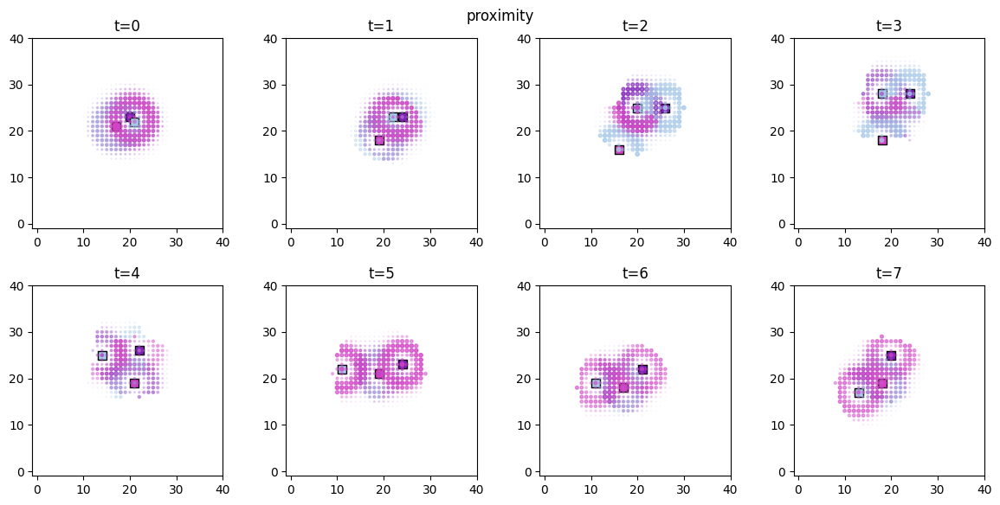

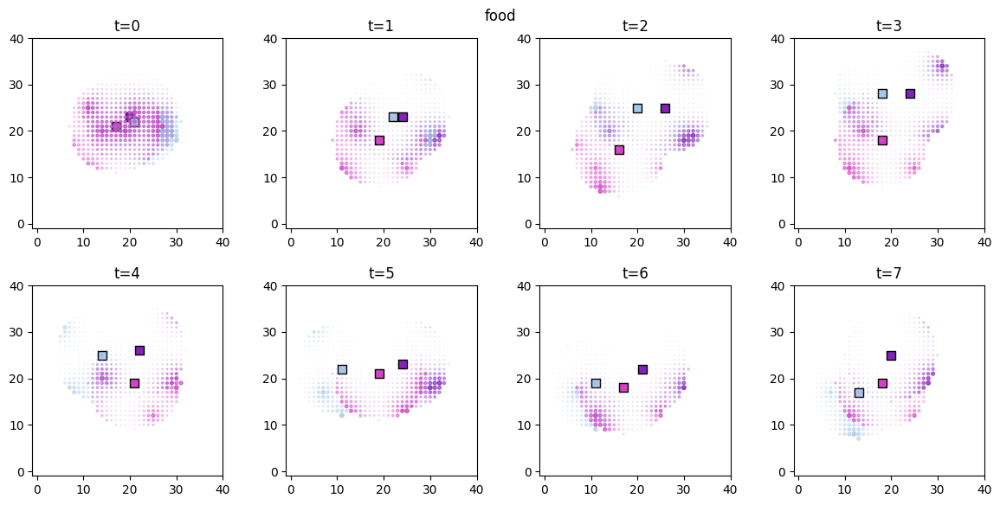

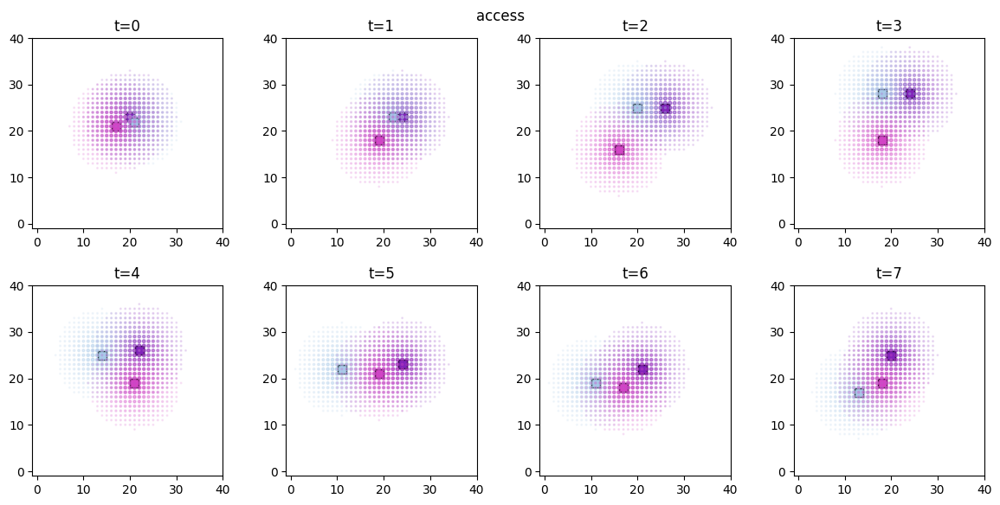

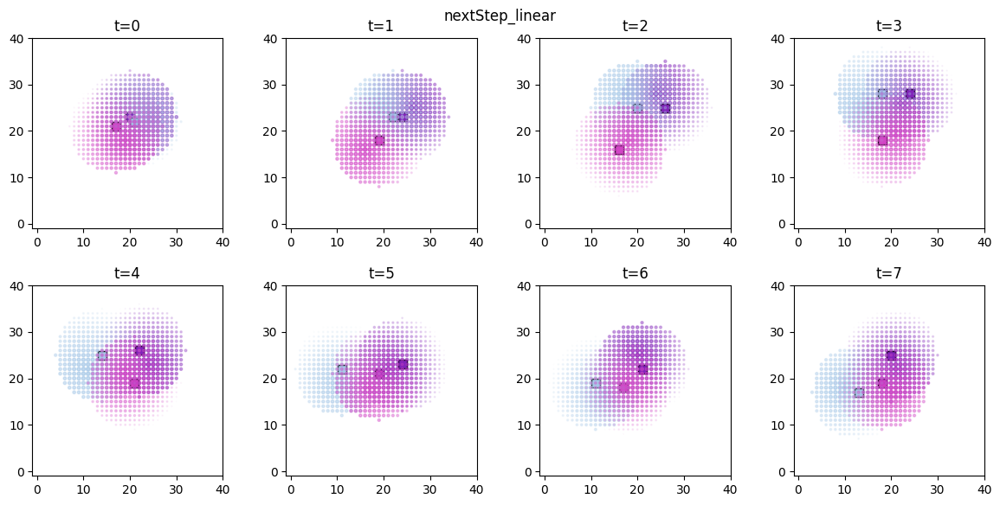

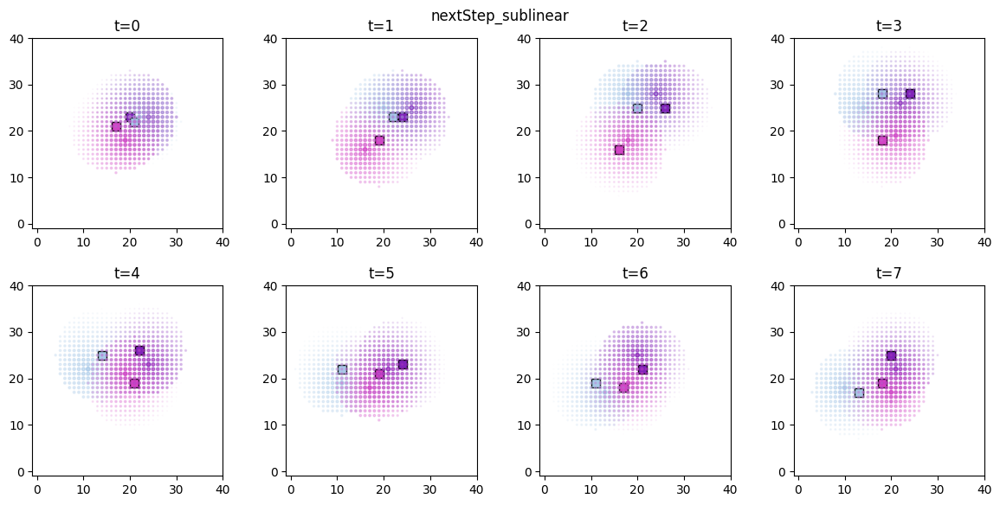

In [14]:
for derived_quantity_name in random_foragers_sim.derived_quantities.keys():
    ft.plot_predictor(
        random_foragers_sim.foragers,
        random_foragers_sim.derived_quantities[derived_quantity_name],
        predictor_name=derived_quantity_name,
        time=range(min(8, num_frames)),
        grid_size=40,
        size_multiplier=10,
        random_state=99,
        forager_position_indices=[0, 1, 2],
        forager_predictor_indices=[0, 1, 2],
    )
    plt.suptitle(derived_quantity_name)
    plt.show()

The time evolution of the derived values can be conveniently animated.

2024-10-28 13:54:33,739 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


50


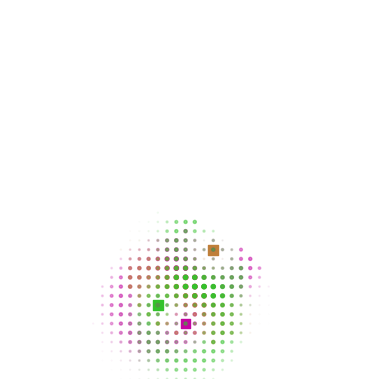

In [15]:
ani = ft.animate_predictors(
    random_foragers_sim.foragersDF,
    random_foragers_sim.derived_quantities["proximity"],
    predictor_name="proximity",
    forager_position_indices=[0, 1, 2],
    forager_predictor_indices=[0, 1, 2],
    grid_size=40,
    random_state=10,
    size_multiplier=10,
)
HTML(ani.to_jshtml())

2024-10-28 13:54:35,987 - Animation.save using <class 'matplotlib.animation.HTMLWriter'>


50


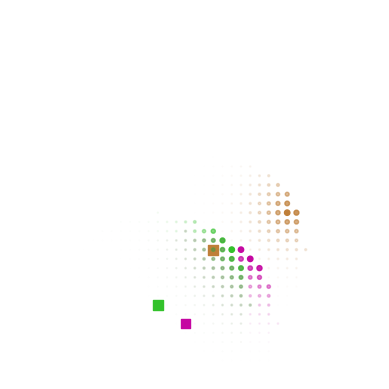

In [16]:
ani = ft.animate_predictors(
    random_foragers_sim.foragersDF,
    random_foragers_sim.derived_quantities["food"],
    predictor_name="food",
    forager_position_indices=[0, 1, 2],
    forager_predictor_indices=[0, 1, 2],
    grid_size=40,
    random_state=10,
    size_multiplier=15,
)
HTML(ani.to_jshtml())

## Inference

Now we fit the next step score as a linear combination of the predictors. We consider the following Bayesian model for the distribution of the score $S_{\text{nextStep}}^{(i)}(x,y,t)$:

$$
\begin{align*}
b_{\mu},w_{k,\mu} & \sim \mathcal{N}(0,\sigma_{\mu})\\
b_{\sigma},w_{k,\sigma} & \sim \mathcal{N}(0,\sigma_{\sigma})\\
\mu &= b_{\mu} + \sum_{k=1}^{N_p} w_{k,\mu} f^{(i)}_k(x,y,t)  \\
\sigma &=\operatorname{softplus}\biggl(b_{\sigma} + \sum_{k=1}^{N_p}  w_{k,\sigma} f^{(i)}_k(x,y,t) \biggr)\\
S_{\text{nextStep}}^{(i)}(x,y,t) &\sim \mathcal{N}(\mu,\sigma)\\
\end{align*}
$$
The priors for the latent variables are normal distributions centered at zero with standard deviations set to slightly regularizing values of 0.6, 0.2, that is, $\sigma_{\mu}$ and $\sigma_{\sigma}$, respectively. Recall that $\operatorname{softplus}(x)=\log(1+\exp(x))$.

The inference task is: given the values of the actual (observed) score values $S_{\text{next\_step}}^{(i)}(x,y,t)$ and the predictor values $f_k^{(i)}$ (these are precisely the derived quantities computed previously), find the posterior distributions of the $2+2N_p$ parameters $\{b_{\mu},b_{\sigma}\} \cup \{w_{k,\mu}, w_{k,\sigma}\}_{k=1}^{N_p}$. For that goal we use the [`pyro` package](https://docs.pyro.ai/en/stable/), a popular Python-based universal probabilistic programming framework.

Our eventual parameters of interest are the $\{w_{k,\mu}\}_{k=1}^{N_p}$. Roughly speaking, this corresponds to the predictive relationship
$$
S_{\text{nextStep}}^{(i)}(x,y,t) \approx b_i + \sum_{k=1}^{N_p} w_{k,\mu} f^{(i)}_k(x,y,t).
$$

We start by preparing the training data as tensor dictionaries. All the data is flattened to 1D.

In [17]:
predictors = ["proximity_scaled", "food_scaled", "access_scaled"]
outcome_vars = ["nextStep_sublinear"]

predictor_tensors_random, outcome_tensor_random = ft.prep_data_for_inference(
    random_foragers_sim, predictors, outcome_vars
)

predictor_tensors_random, outcome_tensor_random

2024-10-28 13:54:38,362 - Sample size: 43675


({'proximity_scaled': tensor([0.5239, 0.5618, 0.5787,  ..., 0.5725, 0.6671, 0.5055]),
  'food_scaled': tensor([0.3077, 0.2762, 0.2844,  ..., 0.5081, 0.7455, 0.1851]),
  'access_scaled': tensor([0.0000, 0.0048, 0.0169,  ..., 0.0169, 0.0048, 0.0000])},
 {'nextStep_sublinear': tensor([0.0000, 0.0143, 0.0238,  ..., 0.1496, 0.1343, 0.1088])})

In [18]:
# plot outcome vs predictors
ft.visualise_forager_predictors(
    predictors=[
        predictor_tensors_random["proximity_scaled"],
        predictor_tensors_random["food_scaled"],
        predictor_tensors_random["access_scaled"],
    ],
    predictor_names=["proximity_scaled", "food_scaled", "access_scaled"],
    outcome_name="nextStep_sublinear",
    outcome=outcome_tensor_random["nextStep_sublinear"],
    sampling_rate=0.5,
)

Now we create the Pyro model.

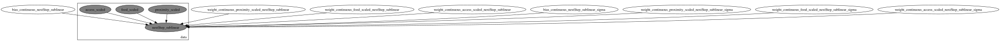

In [19]:
model_sigmavar_random = ft.HeteroskedasticLinear(
    predictor_tensors_random, outcome_tensor_random
)
pyro.render_model(
    model_sigmavar_random,
    model_args=(predictor_tensors_random, outcome_tensor_random),
    # render_deterministic=True, # this requires Pyro>1.9
)

Aside for the two bias terms, for each predictor $f_k$ we have 2 associated variables in the above (generalized) linear Gaussian model:
* `weight` for the mean ($w_{k,\mu}$ above),
* `weight` for the standard deviation ($w_{k,\sigma}$ above).

The `get_samples` function runs the Stochastic Variational Inference algorithm in `Pyro` and returns a results dictionary with the following keys:
* `samples`: the actual samples from the posterior predictive distribution. A dictionary indexed by the inferred variable names (see above),
* `guide`: the `pyro` guide object used in the SVI algorithm,
* `predictive`: an instance of `pyro.infer.Predictive` capable of generating new samples if need be.

2024-10-28 13:54:39,323 - Starting SVI inference with 1500 iterations.


[iteration 0001] loss: 169343.6719
[iteration 0200] loss: 103110.3047
[iteration 0400] loss: 102820.6016
[iteration 0600] loss: 102484.0312
[iteration 0800] loss: 102495.9297
[iteration 1000] loss: 102464.2891
[iteration 1200] loss: 102411.2266
[iteration 1400] loss: 102442.7188


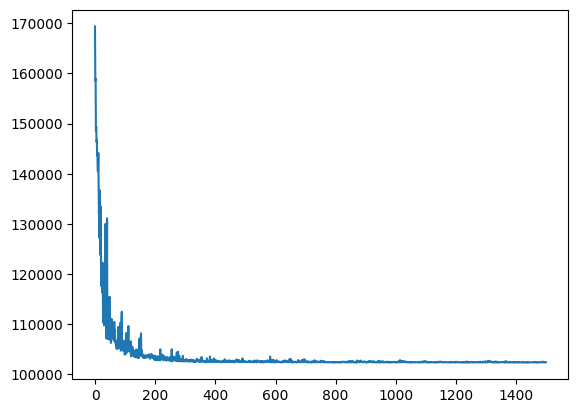

2024-10-28 13:54:49,412 - SVI inference completed in 10.09 seconds.


Coefficient marginals:
Site: weight_continuous_proximity_scaled_nextStep_sublinear
       mean       std       5%       25%       50%       75%       95%
0  0.024934  0.013398  0.00314  0.015859  0.025298  0.033872  0.047168 

Site: weight_continuous_food_scaled_nextStep_sublinear
       mean     std        5%       25%       50%       75%       95%
0 -0.021922  0.0116 -0.040728 -0.029849 -0.022157 -0.014026 -0.003171 

Site: weight_continuous_access_scaled_nextStep_sublinear
      mean       std        5%       25%       50%      75%       95%
0  0.64597  0.014731  0.620537  0.636394  0.646301  0.65577  0.669115 



In [20]:
results_random = ft.get_samples(
    model=model_sigmavar_random,
    predictors=predictor_tensors_random,
    outcome=outcome_tensor_random,
    num_svi_iters=1500,
    num_samples=1000,
)

We can now visualize the posterior distributions of the parameters $
\{w_{k,\mu}\}_{k=1}^{N_p}$.

In [21]:
selected_sites = [
    key
    for key in results_random["samples"].keys()
    if key.startswith("weight") and not key.endswith("sigma")
]
selected_samples = {key: results_random["samples"][key] for key in selected_sites}

ft.plot_coefs(
    selected_samples, "Random foragers", nbins=120, ann_start_y=160, ann_break_y=50
)

# save the samples for future use if not present
if not os.path.exists("sim_data/random_foragers_samples.dill"):
    with open(os.path.join("sim_data/random_foragers_samples.dill"), "wb") as f:
        dill.dump(selected_samples, f)

As expected, the only nonzero coefficient is `access`. The access predictor is indeed independent from the other foragers or the food distribution, and depends solely on the distance between the forager and the target location.


Finally we are able to compare the resulting predictive distribution with the observed data. 

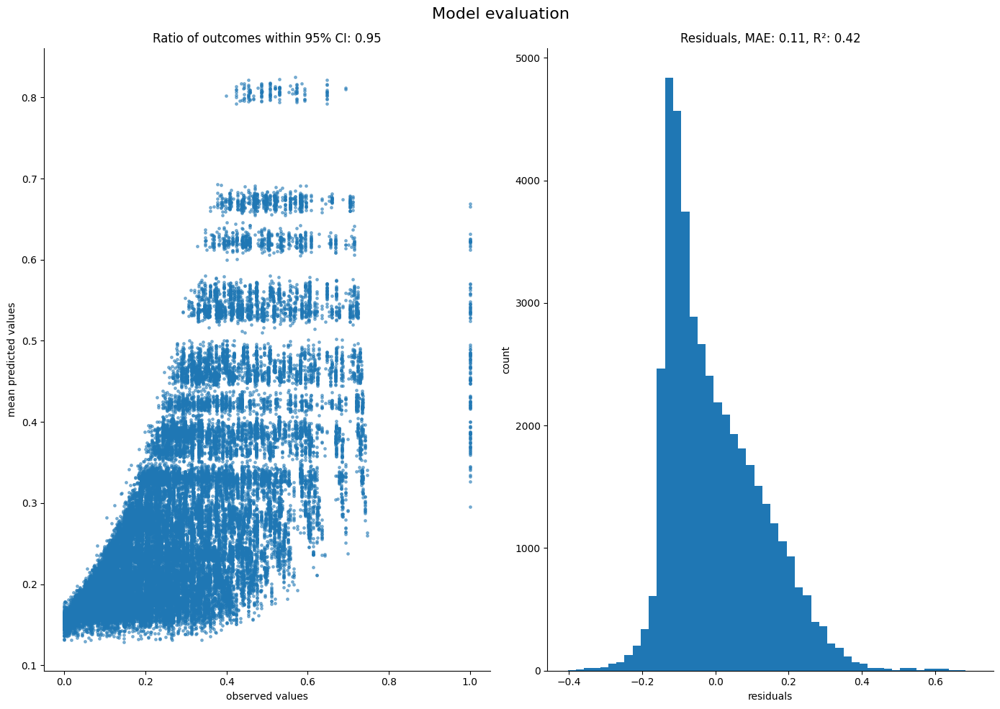

In [22]:
ft.evaluate_performance(
    model=model_sigmavar_random,
    guide=results_random["guide"],
    predictors=predictor_tensors_random,
    outcome=outcome_tensor_random,
    num_samples=1000,
)